In [ ]:
# default_exp oco2map

In [ ]:
#hide
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
#%matplotlib inline
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [ ]:
# If the graph do not display, try :
#!jupyter labextension install jupyterlab-plotly
# You may have to upgrade Node and Jupyter

# MAP : Module to display the data on a map

In [ ]:
# export
import plotly.graph_objects as go

## Display a 2D scatter plot of the mesured CO2 level together with the evaluation method

In [ ]:
# export
def build_sounding_scatter(df_sounding, gaussian_param, plot_gaussian = True, template='plotly_dark'):
    xco2 = go.Scatter(
                    x=df_sounding['distance'],
                    y=df_sounding['xco2'],
                    text='xco2',
                    mode='markers',
                    opacity=0.5,
                    marker={
                        'size': 5,
                        'line': {'width': 0.5, 'color': 'white'}
                    },
                    name="xco2"
                )
    layout = go.Layout(
                xaxis={'title': 'Distance (km)'},
                yaxis={'title': 'CO² level in ppm'},
                #margin={'l': 40, 'b': 40, 't': 10, 'r': 10},
                legend={'x': 0, 'y': 1},
                hovermode='closest',
                template=template
            )
    if plot_gaussian:
        gaussian_plot = go.Scatter(x=df_sounding['distance'], y=df_sounding['gaussian_y'], name="Gaussian fit",
                    hoverinfo='name',
                    line_shape='spline')
        sounding_plot = {
            'data': [xco2,gaussian_plot],
            'layout': layout
        }
    else:
        sounding_plot = {
            'data': [ xco2 ],
            'layout': layout
        }
    return sounding_plot

In [ ]:
from oco2peak.datasets import Datasets
from oco2peak import find_peak
import re
import plotly.io as pio
import json

config_file = './configs/config.json'
# Load config
with open(config_file) as json_data_file:
    config = json.load(json_data_file)
datasets = Datasets(config_file)
url_month = datasets.get_files_urls('/datasets/oco-2/peaks-detected/','result_for_oco2_1808')[0]
url_peak = datasets.get_files_urls('/datasets/oco-2/peaks-detected-details/', 'peak_data-si_2018082505')[0]
print(url_peak)
df_month = datasets.get_dataframe(url_month)
#df_month.head(3)
df_peak = datasets.get_dataframe(url_peak)

https://storage.gra.cloud.ovh.net/v1/AUTH_2aaacef8e88a4ca897bb93b984bd04dd/oco2//datasets/oco-2/peaks-detected-details/peak_data-si_2018082505142073.json


2018082505142073


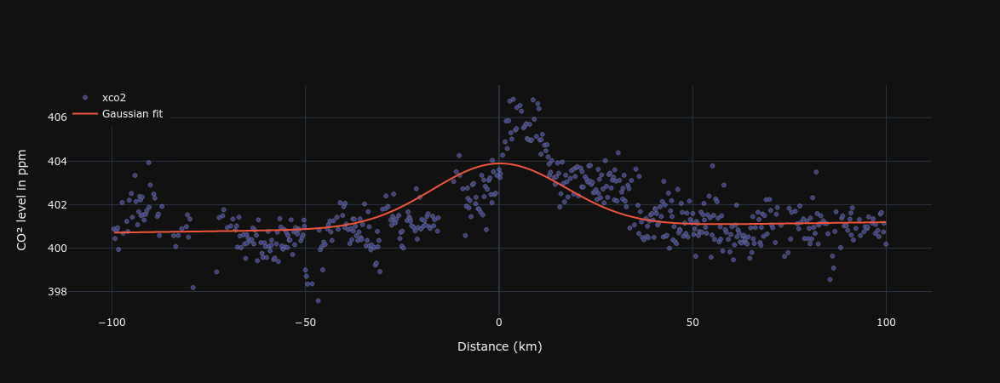

In [ ]:

sounding_id = re.findall(r'(\d{16})', url_peak)[-1]
print(sounding_id)
gaussian_param = datasets.get_peak_param(sounding_id, df_month)
df_peak['gaussian_y'] = df_peak.distance.apply(
    lambda x: find_peak.gaussian(x=x, m=gaussian_param['slope'], b=gaussian_param['intercept'], A=gaussian_param['amplitude'], sig=gaussian_param['sigma']))

sounding_scatter = build_sounding_scatter(df_peak, gaussian_param)
pio.show(sounding_scatter)

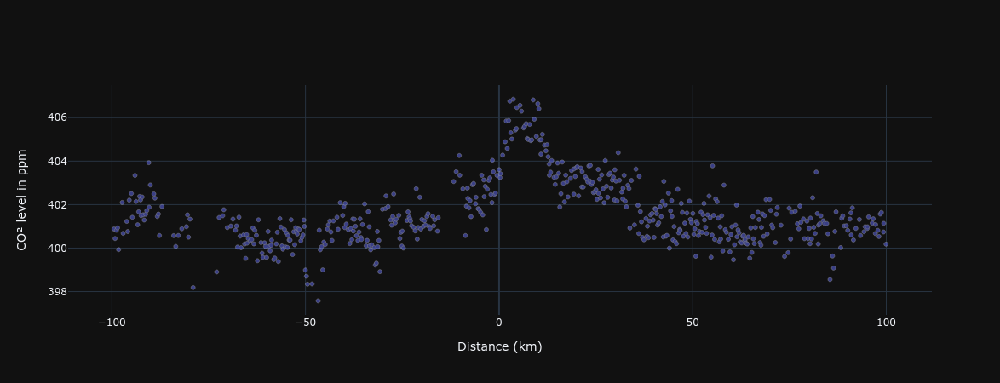

In [ ]:
#ingnore
sounding_scatter = build_sounding_scatter(df_peak[['distance','xco2']], gaussian_param, False)
pio.show(sounding_scatter)

In [ ]:
gaussian_param

{'sounding_id': 2018082505142073.0,
 'latitude': 36.15449523925781,
 'longitude': 117.35135650634766,
 'orbit': 22061.0,
 'slope': 0.002404878134493732,
 'intercept': 400.9522740417127,
 'amplitude': 126.99320443348364,
 'sigma': 17.224089047783526,
 'delta': 2.9414013380695354,
 'R': 0.7399547771699629,
 'windspeed_u': -2.912532329559326,
 'windspeed_v': 0.5975844860076904,
 'surface_pressure': 996.53076171875,
 'tcwv': 27.93094062805176,
 'gCO2_per_s': 5028268.924630236,
 'ktCO2_per_h': 18.101768128668848}

## Display the CO2 measurement on a map

In [ ]:
# export
def build_sounding_map(df_sounding, mapbox_token, peak_param=None, template='plotly_dark'):
    df = df_sounding
    center_lat = peak_param['latitude'] #df.latitude.min() + (df.latitude.max() - df.latitude.min())/2
    center_lon = peak_param['longitude'] #df.longitude.min() + (df.longitude.max() - df.longitude.min())/2
    xco_sounding_mapbox = go.Figure()
    _ = xco_sounding_mapbox.add_trace(go.Scattermapbox(
        lat=df.latitude,
        lon=df.longitude,
        mode='markers',
        marker=go.scattermapbox.Marker(color = df['xco2'], size=10, opacity=0.5),
        text=df.xco2,
        name='CO2 level'
    )) 
        
    if peak_param is not None:
        wind_u = peak_param['windspeed_u']
        wind_v = peak_param['windspeed_v']
        x0=peak_param['latitude']
        y0=peak_param['longitude']
        x1=peak_param['latitude']+wind_u*0.3
        y1=peak_param['longitude']+wind_v*0.3
        _ = xco_sounding_mapbox.add_trace(go.Scattermapbox(
            mode = "lines",
            lon = [y0, y1],
            lat = [x0, x1],
            name="Wind direction",
            marker = {'size': 10})
            )
    xco_sounding_mapbox.update_layout(
        mapbox_style="satellite-streets",
        template=template,
        hovermode='closest',
        mapbox=dict(
            accesstoken=mapbox_token,
            bearing=0,
            center=go.layout.mapbox.Center(
                lat=center_lat,
                lon=center_lon
            ),
            pitch=0,
            zoom=6
        )
    )
    return xco_sounding_mapbox

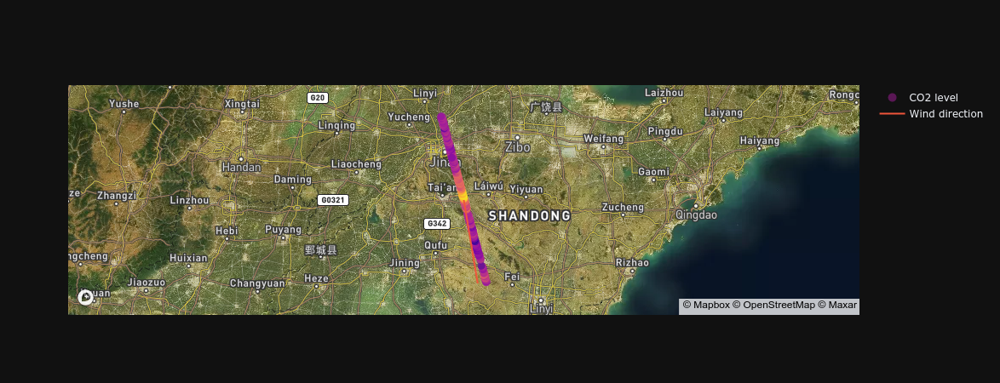

In [ ]:
mapbox_token = config['mapbox_token']
sounding_scatter = build_sounding_map(df_peak, mapbox_token, gaussian_param)
pio.show(sounding_scatter)

In [ ]:
#export
import plotly.graph_objects as go

def plot_emission(df_peak, peak_param, emission):
    fig = go.Figure()
    
    wind_u = emission['wind_u']
    wind_v = emission['wind_v']
    _ = fig.add_shape(
        # Wind vector
        type="line",
        x0=peak_param['latitude'],
        y0=peak_param['longitude'],
        x1=peak_param['latitude']+wind_u*0.3,
        y1=peak_param['longitude']+wind_v*0.3,
        name='Wind',
        line=dict(color="MediumPurple",width=4,dash="dot")
    )

    _ = fig.update_layout(
        showlegend=False,
        annotations=[
            dict(
                x=peak_param['latitude'],
                y=peak_param['longitude'],
                xref='x',
                yref='y',
                text="Wind",
                showarrow=True,
                arrowhead=1,
                ax=peak_param['latitude']+wind_u*0.3,
                ay=peak_param['longitude']+wind_v*0.3,
            )
        ]
    )
    return fig

## Display all the detected peak on a map

In [ ]:
# export
import folium
def build_world_map(data):
    folium_map = folium.Map([43, 0], zoom_start=4)
    folium.TileLayer("CartoDB dark_matter", name="Dark mode").add_to(folium_map)

    # Adding detected peaks
    peaks_group = folium.FeatureGroup(name="Peaks").add_to(folium_map)
    peaks_group_circle = folium.FeatureGroup(name=" - 50km Circles").add_to(folium_map)
    peaks_group_wind = folium.FeatureGroup(name=" - Wind Vectors").add_to(folium_map)
    
    for _, row in data.iterrows():
        radius = row["amplitude"]/20
        color="#FF3333" # red
        tooltip =  f'GPS : [{row.latitude:.2f} , {row.longitude:.2f}]'
        sounding = str(row.sounding_id.astype(int)) # TODO : find why .astype(str) add a '.0'
        date = sounding[:4] + '/' + sounding[4:6] + '/' + sounding[6:8]
        orbit = str(row['orbit'])
        wind = [[row['latitude'],row['longitude']],[row['latitude']+row['windspeed_u'],row['longitude']+row['windspeed_v']]]
        
        popup_html="""<h4>"""+tooltip+"""</h4>"""+date+"""<p>sounding_id: """+sounding+"""</br>orbit: """+orbit+"""</p>"""
        popup_html+='<p><input type="button" value="Show plot"'
        # Injecting JavaScript in popup to fire the Dash Callback
        popup_html+='onclick="\
            let bco_input = parent.document.getElementById(\'input_sounding\'); \
            let lastValue = bco_input.value;'
        popup_html+=f'bco_input.value = \'{sounding}\';'
        popup_html+="let bco_event = new Event('input', { bubbles: true });\
            bco_event.simulated = true;\
            let tracker = bco_input._valueTracker;\
            if (tracker) {\
            tracker.setValue(lastValue);\
            }\
            bco_input.dispatchEvent(bco_event);\
            elt.dispatchEvent(new Event('change'));\
            \"/></p>"
        #onclick="plot_data(\'{url}\', {slope}, {intercept}, {amplitude}, {sigma});"/></p>'

        popup=folium.Popup(popup_html, max_width=450)
        
        peaks_group.add_child(folium.CircleMarker(location=(row["latitude"],
                                    row["longitude"]),
                            radius=radius,
                            color=color,
                            tooltip=tooltip,
                            popup=popup,
                            fill=True))

        peaks_group_circle.add_child(folium.Circle(location=(row["latitude"],
                            row["longitude"]),
                            radius=50000,
                            color='#949494',
                            weight = 1,
                            fill=False))
        
        peaks_group_wind.add_child(folium.PolyLine(wind,
                        color='#B2B2B2',
                        weight = 1))
    return folium_map


In [ ]:
folium_map = build_world_map(df_month)
folium_map

In [ ]:
df_month.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2676 entries, 0 to 2675
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   sounding_id       2676 non-null   int64  
 1   latitude          2676 non-null   float64
 2   longitude         2676 non-null   float64
 3   orbit             2676 non-null   int64  
 4   slope             2676 non-null   float64
 5   intercept         2676 non-null   float64
 6   amplitude         2676 non-null   float64
 7   sigma             2676 non-null   float64
 8   delta             2676 non-null   float64
 9   R                 2676 non-null   float64
 10  windspeed_u       2676 non-null   float64
 11  windspeed_v       2676 non-null   float64
 12  surface_pressure  2676 non-null   float64
 13  tcwv              2676 non-null   float64
 14  gCO2_per_s        2676 non-null   float64
 15  ktCO2_per_h       2676 non-null   float64
dtypes: float64(14), int64(2)
memory usage: 334

In [ ]:
df_month.sounding_id
df_month.iloc[0].sounding_id

i = df_month.iloc[0].sounding_id.astype('int64')
i
str(i)
df_month.iloc[0].sounding_id.astype(str)

0       2018080101035604
1       2018080101060803
2       2018080101062937
3       2018080102530302
4       2018080104244674
              ...       
2671    2018083122422207
2672    2018083122422401
2673    2018083122432571
2674    2018083122433238
2675    2018083122433476
Name: sounding_id, Length: 2676, dtype: int64

2018080101035604.0

2018080101035604

'2018080101035604'

'2018080101035604.0'

In [ ]:
df_month.describe()

,sounding_id,latitude,longitude,orbit,slope,intercept,amplitude,sigma,delta,R,windspeed_u,windspeed_v,surface_pressure,tcwv,gCO2_per_s,ktCO2_per_h
count,2.676000e+03,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2676.000000,2.676000e+03,2676.000000
mean,2.018082e+15,20.583363,-1.875767,21942.166293,-0.001496,404.202138,14.949282,15.023662,0.398446,0.600634,-1.140637,-0.319025,993.770698,24.911690,8.881637e+05,3.197389
std,9.332024e+08,26.539318,105.430800,135.783716,0.006664,1.983343,17.372580,10.100137,0.431653,0.082802,4.453884,3.736084,46.704509,11.394778,9.756148e+05,3.512213
min,2.018080e+15,-40.021149,-179.779083,21709.000000,-0.031395,399.106487,-50.333415,-33.117778,0.000341,0.500107,-9.672325,-9.554490,639.454041,2.738370,3.132355e+01,0.000113
25%,2.018081e+15,-3.602944,-110.273228,21809.000000,-0.006058,402.771374,4.689324,10.850037,0.149730,0.534349,-4.741692,-3.282680,993.717560,15.487782,1.952269e+05,0.702817
50%,2.018082e+15,30.036783,17.476055,21957.000000,-0.002866,404.543480,11.519160,15.673731,0.288495,0.577989,-1.829932,-0.299976,1013.534393,23.571533,5.722775e+05,2.060199
75%,2.018083e+15,40.714655,69.067274,22060.000000,0.003910,405.936083,20.738053,20.947999,0.496575,0.647792,2.371661,2.928284,1017.381927,33.487966,1.254875e+06,4.517549
max,2.018083e+15,72.424393,179.568573,22159.000000,0.025194,408.913894,162.436539,33.249874,5.603435,0.899008,13.551064,11.974917,1035.291138,59.430317,7.737009e+06,27.853234


In [ ]:
df_month

,sounding_id,latitude,longitude,orbit,slope,intercept,amplitude,sigma,delta,R,windspeed_u,windspeed_v,surface_pressure,tcwv,gCO2_per_s,ktCO2_per_h
0,2018080101035604,25.425072,-177.345490,21709,0.000430,404.902899,-14.694226,-3.987167,1.470254,0.677812,-7.759225,-0.739198,1018.198181,41.952118,1.775510e+06,6.391835
1,2018080101060803,32.777554,-179.428162,21709,0.002886,404.622407,1.493849,7.887665,0.075556,0.532213,-5.420354,-0.992332,1025.610962,32.914429,1.296037e+05,0.466573
2,2018080101062937,33.919857,-179.779083,21709,-0.006755,404.416030,-11.847855,-3.346435,1.412432,0.592854,-4.035365,-0.879741,1026.469604,32.334263,3.285550e+04,0.118280
3,2018080102530302,58.858116,143.781662,21710,0.003719,399.445056,-0.018193,-5.552475,0.001307,0.730703,-3.837832,0.812698,995.894531,23.648272,7.214001e+02,0.002597
4,2018080104244674,35.680077,130.219467,21711,-0.004196,405.367275,9.859749,24.716153,0.159146,0.577045,-2.515345,-1.818006,1005.533569,43.828854,4.515588e+05,1.625612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2671,2018083122422207,27.524502,-142.773468,22159,0.005926,403.327619,29.021740,28.648701,0.404137,0.598713,-7.186984,-0.285668,1021.142090,30.150118,3.202881e+06,11.530372
2672,2018083122422401,27.697588,-142.822235,22159,0.002168,403.383178,34.102413,31.243371,0.435449,0.527938,-7.121493,-0.214880,1021.492188,30.335169,3.719459e+06,13.390052
2673,2018083122432571,31.114796,-143.827850,22159,0.006210,403.550794,0.286084,14.724687,0.007751,0.542937,-4.404825,2.101457,1021.766602,29.477139,1.628678e+04,0.058632
2674,2018083122433238,31.412222,-143.909012,22159,0.003365,403.564271,15.091141,22.844005,0.263548,0.506012,-4.287163,2.074741,1016.949829,29.451277,8.295997e+05,2.986559


In [ ]:
from nbdev.export import notebook2script
notebook2script()

Converted 03_25_OCO2_Data_Exploration.ipynb.
Converted 04_01_OCO2_Work_Base.ipynb.
Converted 04_04_OCO2_China_Peaks.ipynb.
Converted 04_15_OCO2_Laiwu_Peak_Detection.ipynb.
Converted CO2_emissions_Inventory_data.ipynb.
Converted CO2_emissions_Inventory_data_20200531.ipynb.
Converted Christian-datasets-Distances.ipynb.
Converted Find_Peaks_with_LSTM_autoencoders.ipynb.
Converted Laiwu_Plume-more_data.ipynb.
Converted Laiwu_Plume-more_data_CD_exploration_selection_peaks.ipynb.
Converted Laiwu_Plume.ipynb.
Converted Process Sandbag data - Find infrastructure location.ipynb.
Converted Untitled1.ipynb.
Converted WIP_OCO2_Capture.ipynb.
Converted WIP_OCO2_Map.ipynb.
Converted WIP_OCO2_Peaks_Wind.ipynb.
Converted WIP_OCO2_Peaks_Wind_Visualization.ipynb.
Converted explorations.ipynb.
Converted find_peak_bco_test.ipynb.
Converted index.ipynb.
Converted oco2peak-datasets.ipynb.
Converted oco2peak-find_peak.ipynb.
Converted oco2peak-map.ipynb.
Converted oco2peak-nc4_convert.ipynb.
Converted oco2pe

In [ ]:
import sys; print(sys.version)

3.7.6 | packaged by conda-forge | (default, Mar 23 2020, 23:03:20) 
[GCC 7.3.0]
